# Double Jet

With various grid sizes

In [35]:
from gpuocean.utils import Common, IPythonMagic

from importlib import reload

import numpy as np
import copy
import pycuda.driver as cuda
from matplotlib import pyplot as plt

plt.style.use('dark_background')

plt.rcParams["image.origin"] = "lower"


In [36]:
%cuda_context_handler gpu_ctx

In [37]:
import sys, os
sys.path.insert(0, os.path.abspath(os.path.join(os.getcwd(), '../')))
from utils.DoubleJetPlot import *

Get initial arguments from class

In [38]:
from gpuocean.utils import DoubleJetCase

In [39]:
doubleJetCase = DoubleJetCase.DoubleJetCase(gpu_ctx, DoubleJetCase.DoubleJetPerturbationType.SteadyState, ny=256, nx=512)
doubleJetCase_args, doubleJetCase_init, _ = doubleJetCase.getInitConditions()

## Truth

In [40]:
truth_path = "/home/florianb/havvarsel/multilevelDA/doublejet/scripts/DataAssimilation/DoubleJetTruth/2023-10-30T13_00_13"

true_state = np.load(os.path.join(truth_path, "truth_864000.npy"))

(<Figure size 1500x1000 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

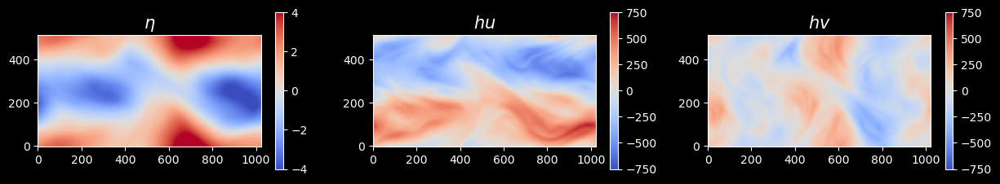

In [41]:
imshow3(true_state, eta_vlim=4)

## Ensembles

In [42]:
from utils.DoubleJetSL import *

In [43]:
def plot_SLstates(sl_state):
    from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
    from mpl_toolkits.axes_grid1.colorbar import colorbar

    fig, axs = plt.subplots(3,3, figsize=(20,15))

    def _add_cb(ax, im, label=None):
        ax_divider = make_axes_locatable(ax)
        ax_cb = ax_divider.append_axes("top", size="10%", pad="5%")
        cbar = colorbar(im, cax=ax_cb, orientation="horizontal")
        ax_cb.xaxis.set_ticks_position("top")
        ax_cb.set_title(label)


    SL_mean = np.mean(sl_state, axis=-1)
    vlims = [4, 750, 750]
    for i in range(3):
        im = axs[0,i].imshow(SL_mean[i], cmap=plt.cm.coolwarm, vmin=-vlims[i], vmax=vlims[i])
        _add_cb(axs[0,i], im)

    SL_std = np.std(sl_state, axis=-1, ddof=1)
    vlims = [0.5, 100, 100]
    for i in range(3):
        im = axs[1,i].imshow(SL_std[i], cmap=plt.cm.Oranges, vmin=0, vmax=vlims[i])
        _add_cb(axs[1,i], im)

    rescale = true_state.shape[1]//sl_state.shape[1]
    SL_err = np.abs(np.mean(sl_state, axis=-1).repeat(rescale,1).repeat(rescale,2) - true_state) 
    vlims = [0.5, 100, 100]
    for i in range(3):
        im = axs[2,i].imshow(SL_err[i], cmap=plt.cm.Reds, vmin=0, vmax=vlims[i])
        _add_cb(axs[2,i], im)

In [44]:
slda_path = "/home/florianb/havvarsel/multilevelDA/doublejet/scripts/DataAssimilation/DoubleJetSLDA/2023-10-30T13_31_00"

sl_state = np.load(os.path.join(slda_path, "SLstates/SLensemble_864000.npy"))

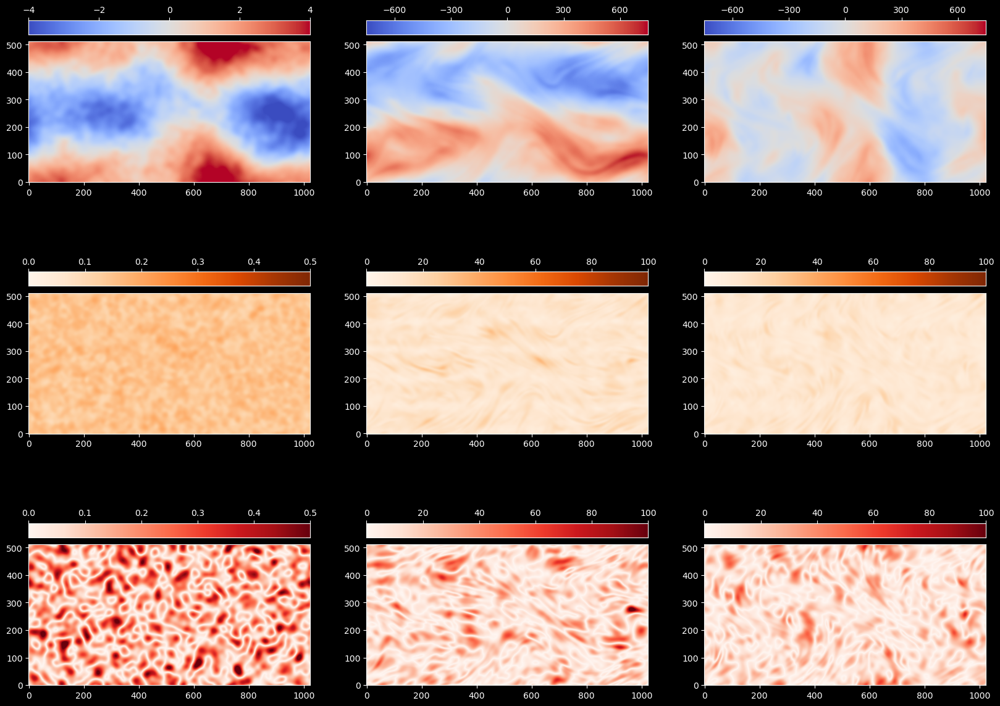

In [45]:
plot_SLstates(sl_state)

In [46]:
slda2_path = "/home/florianb/havvarsel/multilevelDA/doublejet/scripts/DataAssimilation/DoubleJetSLDA/2023-10-30T14_19_05"

sl2_state = np.load(os.path.join(slda2_path, "SLstates/SLensemble_864000.npy"))

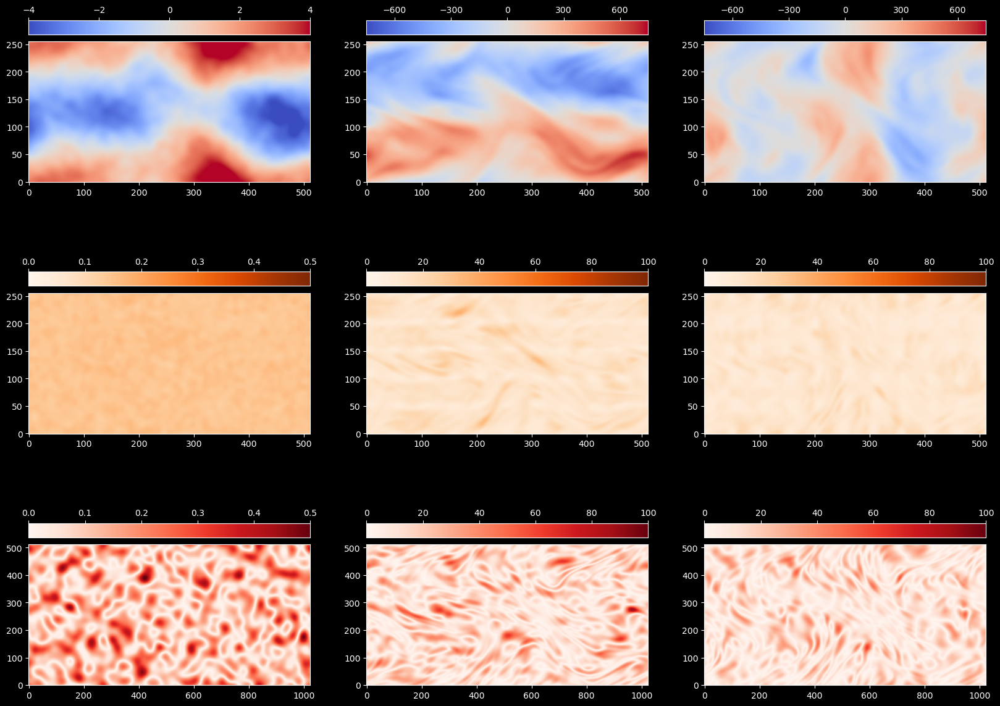

In [47]:
plot_SLstates(sl2_state)

In [48]:
slda3_path = "/home/florianb/havvarsel/multilevelDA/doublejet/scripts/DataAssimilation/DoubleJetSLDA/2023-10-30T14_37_09"

sl3_state = np.load(os.path.join(slda3_path, "SLstates/SLensemble_864000.npy"))

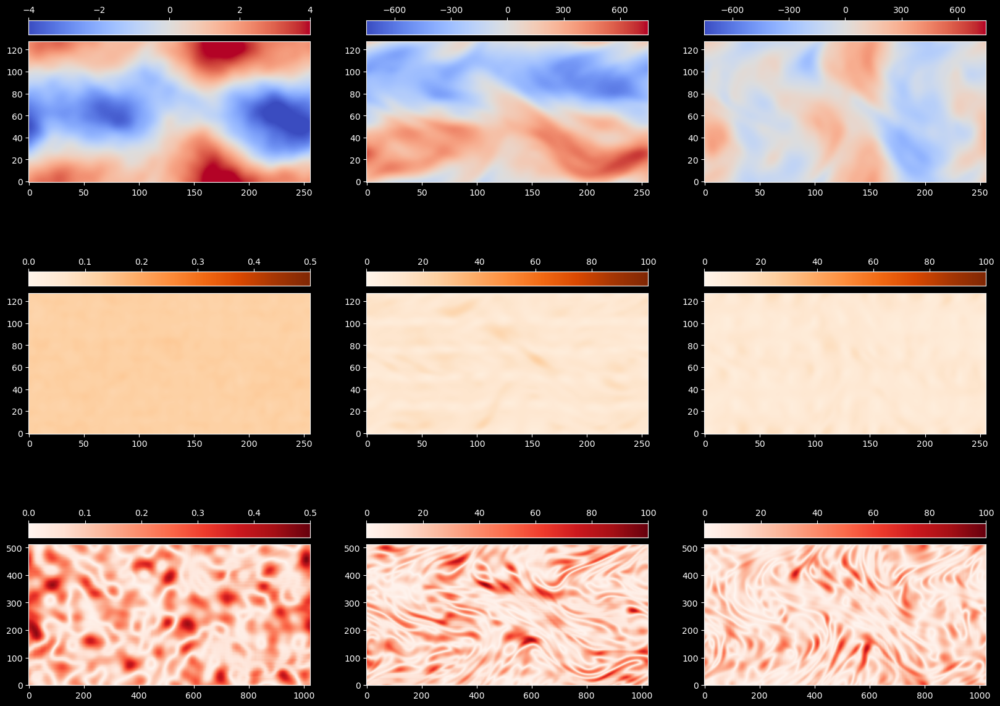

In [49]:
plot_SLstates(sl3_state)

In [50]:
slda4_path = "/home/florianb/havvarsel/multilevelDA/doublejet/scripts/DataAssimilation/DoubleJetSLDA/2023-10-30T14_53_12"

sl4_state = np.load(os.path.join(slda4_path, "SLstates/SLensemble_864000.npy"))

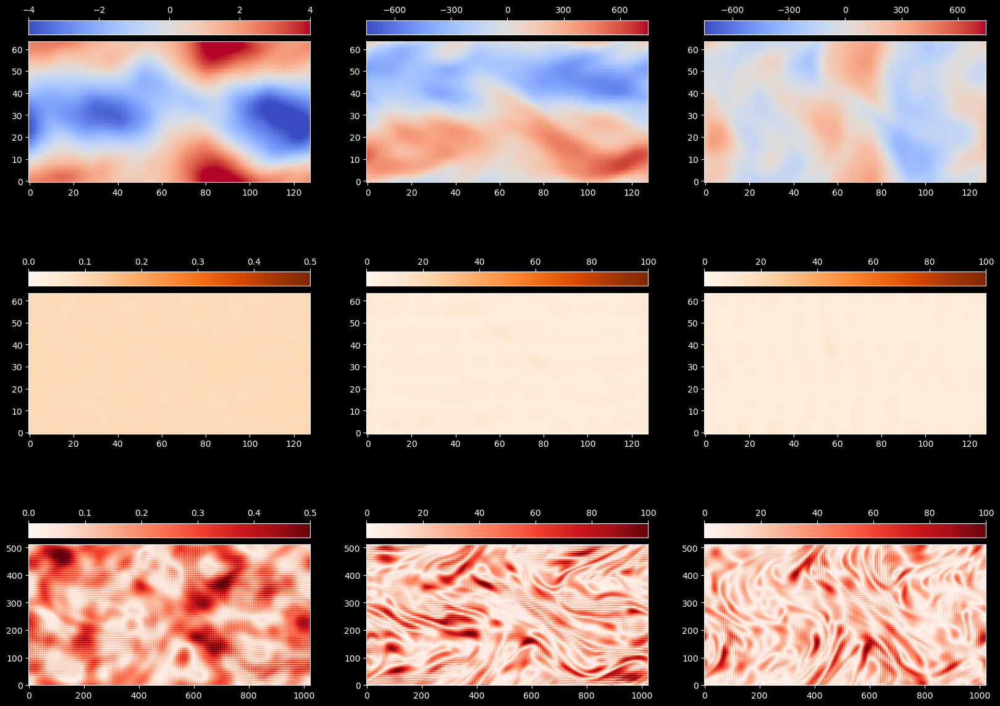

In [51]:
plot_SLstates(sl4_state)

In [52]:
def MLestimator(ML_state, func, **kwargs):
    numLevels = len(ML_state)
    MLest = np.zeros(ML_state[-1][0].shape[:-1])
    MLest += func(ML_state[0], axis=-1, **kwargs).repeat(2**(numLevels-1),1).repeat(2**(numLevels-1),2)
    for l_idx in range(1, numLevels):
        MLest += (func(ML_state[l_idx][0], axis=-1, **kwargs) - func(ML_state[l_idx][1], axis=-1, **kwargs).repeat(2,1).repeat(2,2)).repeat(2**(numLevels-l_idx-1),1).repeat(2**(numLevels-l_idx-1),2)
    return MLest

In [53]:
def plot_MLstates(ml_state):
    from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
    from mpl_toolkits.axes_grid1.colorbar import colorbar

    from gpuocean.ensembles import MultiLevelOceanEnsemble
    fig, axs = plt.subplots(3,3, figsize=(20,15))

    def _add_cb(ax, im, label=None):
        ax_divider = make_axes_locatable(ax)
        ax_cb = ax_divider.append_axes("top", size="10%", pad="5%")
        cbar = colorbar(im, cax=ax_cb, orientation="horizontal")
        ax_cb.xaxis.set_ticks_position("top")
        ax_cb.set_title(label)


    ML_mean = MLestimator(ml_state, np.mean)
    vlims = [4, 750, 750]
    for i in range(3):
        im = axs[0,i].imshow(ML_mean[i], cmap=plt.cm.coolwarm, vmin=-vlims[i], vmax=vlims[i])
        _add_cb(axs[0,i], im)

    ML_std = MLestimator(ml_state, np.std, ddof=1)
    vlims = [0.5, 100, 100]
    for i in range(3):
        im = axs[1,i].imshow(ML_std[i], cmap=plt.cm.Oranges, vmin=0, vmax=vlims[i])
        _add_cb(axs[1,i], im)

    ML_err = np.abs(ML_mean - true_state) 
    vlims = [0.5, 100, 100]
    for i in range(3):
        im = axs[2,i].imshow(ML_err[i], cmap=plt.cm.Reds, vmin=0, vmax=vlims[i])
        _add_cb(axs[2,i], im)

In [54]:
mlda1_path = "/home/florianb/havvarsel/multilevelDA/doublejet/scripts/DataAssimilation/DoubleJetMLDA/2023-10-31T08_40_26"

ML1_state = []

ML1_state.append(np.load(mlda1_path+"/MLstates/MLensemble_0.npy"))

numLevels = len(set([f.split("_")[1][0] for f in os.listdir(mlda1_path+"/MLstates")]))
for l_idx in range(1, numLevels):
    ML1_state.append( [np.load(mlda1_path+"/MLstates/MLensemble_"+str(l_idx)+"_0.npy"), np.load(mlda1_path+"/MLstates/MLensemble_"+str(l_idx)+"_1.npy")] )


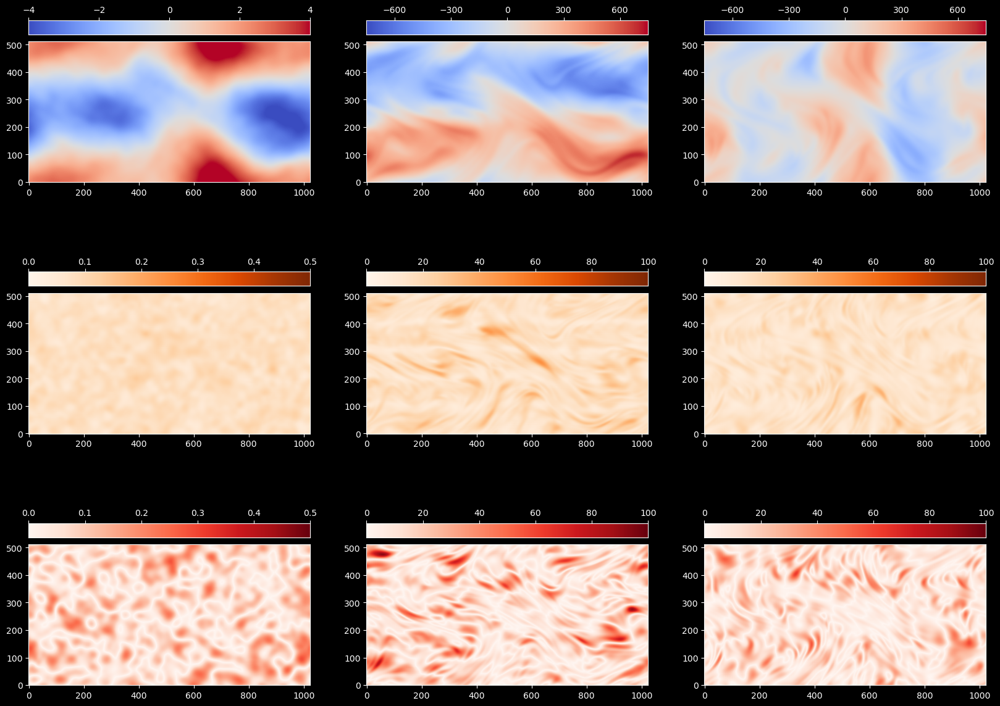

In [55]:
plot_MLstates(ML1_state)

In [56]:
mlda2_path = "/home/florianb/havvarsel/multilevelDA/doublejet/scripts/DataAssimilation/DoubleJetMLDA/2023-10-31T08_40_29"

ML2_state = []

ML2_state.append(np.load(mlda2_path+"/MLstates/MLensemble_0.npy"))

numLevels = len(set([f.split("_")[1][0] for f in os.listdir(mlda2_path+"/MLstates")]))
for l_idx in range(1, numLevels):
    ML2_state.append( [np.load(mlda2_path+"/MLstates/MLensemble_"+str(l_idx)+"_0.npy"), np.load(mlda2_path+"/MLstates/MLensemble_"+str(l_idx)+"_1.npy")] )

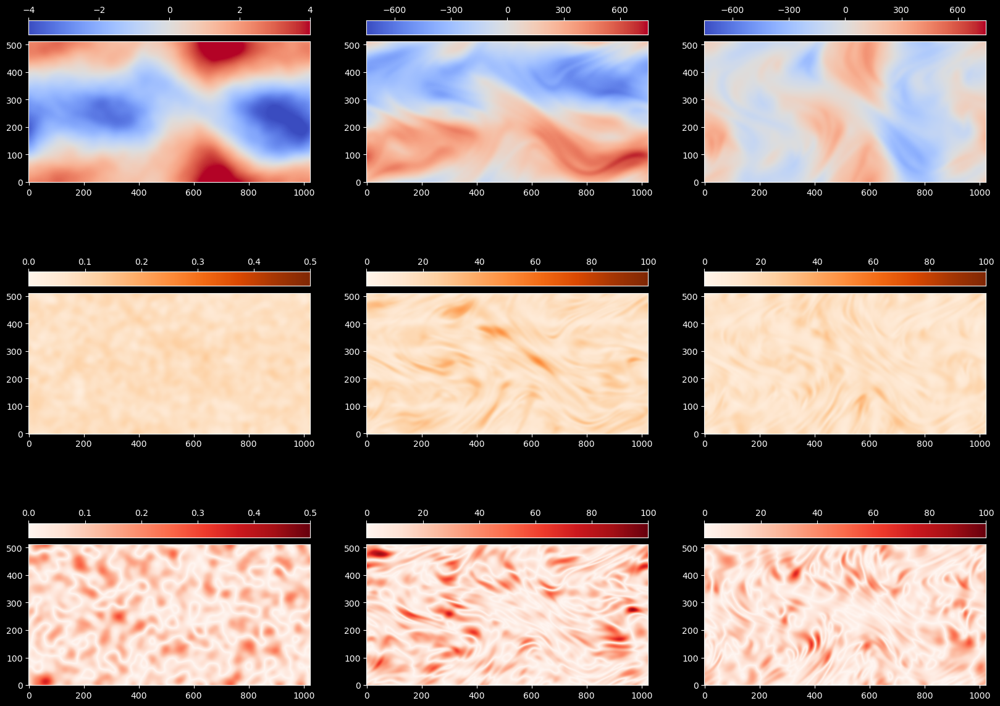

In [57]:
plot_MLstates(ML2_state)

In [58]:
mlda3_path = "/home/florianb/havvarsel/multilevelDA/doublejet/scripts/DataAssimilation/DoubleJetMLDA/2023-10-31T09_33_44"

ML3_state = []

ML3_state.append(np.load(mlda3_path+"/MLstates/MLensemble_0.npy"))

numLevels = len(set([f.split("_")[1][0] for f in os.listdir(mlda3_path+"/MLstates")]))
for l_idx in range(1, numLevels):
    ML3_state.append( [np.load(mlda3_path+"/MLstates/MLensemble_"+str(l_idx)+"_0.npy"), np.load(mlda3_path+"/MLstates/MLensemble_"+str(l_idx)+"_1.npy")] )

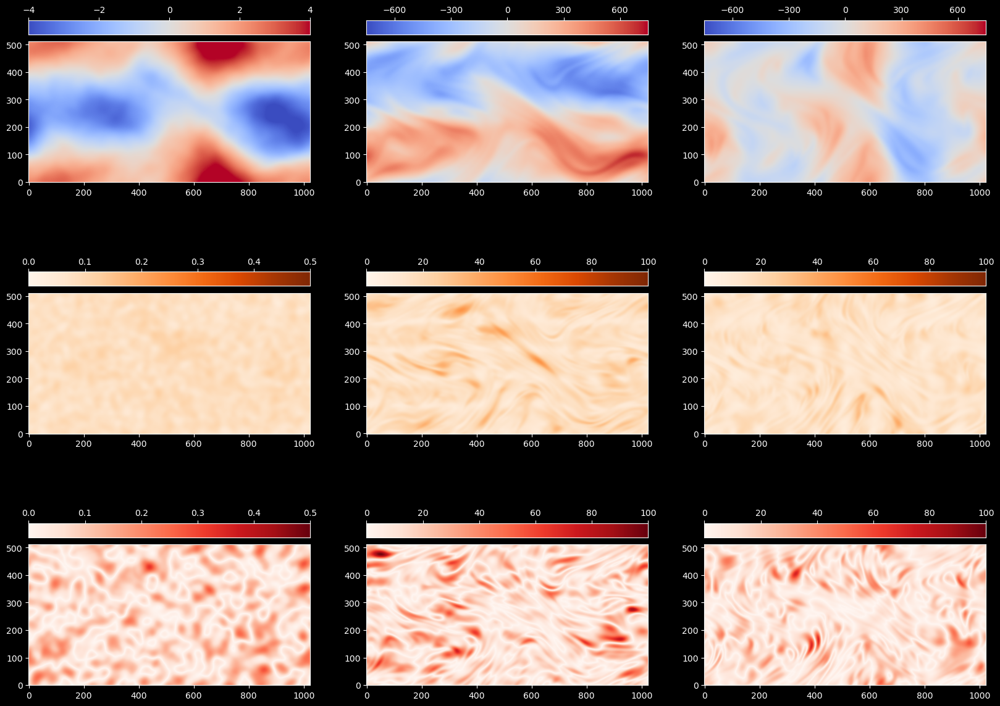

In [59]:
plot_MLstates(ML3_state)

In [60]:
def MLMSE(ML_state, true_state):
    numLevels = len(ML_state)
    MLest = np.zeros(ML_state[-1][0].shape[:-1])
    MLest += np.mean((ML_state[0].repeat(2**(numLevels-1),1).repeat(2**(numLevels-1),2) - true_state[:,:,:,np.newaxis])**2, axis=-1) 
    for l_idx in range(1, numLevels):
        MLest += np.mean((ML_state[l_idx][0].repeat(2**(numLevels-l_idx-1),1).repeat(2**(numLevels-l_idx-1),2) - true_state[:,:,:,np.newaxis])**2
                          - (ML_state[l_idx][1].repeat(2**(numLevels-l_idx),1).repeat(2**(numLevels-l_idx),2) - true_state[:,:,:,np.newaxis])**2,
                          axis=-1)
    return np.sqrt(np.maximum(0,MLest))

(<Figure size 1500x1000 with 6 Axes>,
 array([<AxesSubplot:title={'center':'$\\eta$'}>,
        <AxesSubplot:title={'center':'$hu$'}>,
        <AxesSubplot:title={'center':'$hv$'}>], dtype=object))

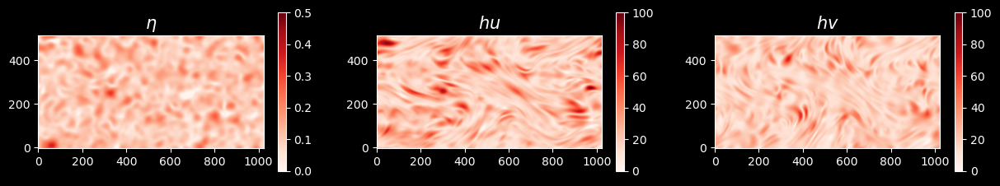

In [61]:
imshow3var(MLMSE(ML2_state, true_state), eta_vlim=0.5, huv_vlim=100)

In [62]:
sl4_state == sl2_state

/home/florianb/miniforge3/envs/gpuocean/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  """Entry point for launching an IPython kernel.


False

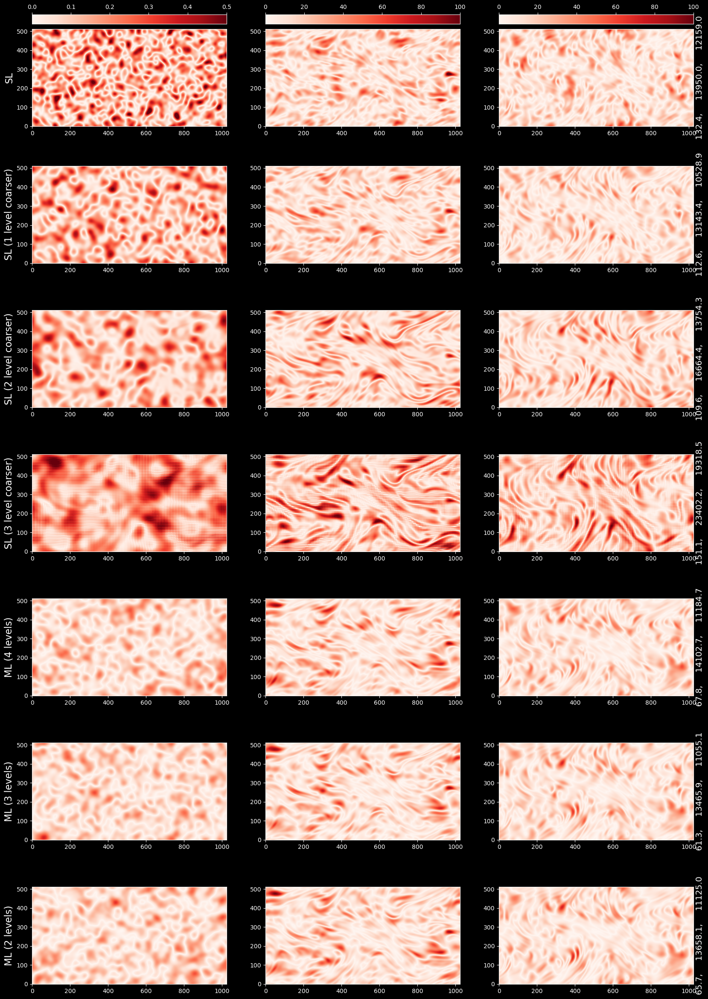

In [63]:
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable
from mpl_toolkits.axes_grid1.colorbar import colorbar

fig, axs = plt.subplots(7,3, figsize=(20,30))

def _add_cb(ax, im, label=None):
    ax_divider = make_axes_locatable(ax)
    ax_cb = ax_divider.append_axes("top", size="10%", pad="5%")
    cbar = colorbar(im, cax=ax_cb, orientation="horizontal")
    ax_cb.xaxis.set_ticks_position("top")
    ax_cb.set_title(label)

vlims=[0.5, 100, 100]
def _plot3(axs, state, cbar=False):
    for i in range(3):
        im = axs[i].imshow(state[i], cmap=plt.cm.Reds, vmin=0, vmax=vlims[i])
        if cbar:
            _add_cb(axs[i], im)
    axs[2].yaxis.set_label_position("right")
    axs[2].set_ylabel(",     ".join(["{:.1f}".format(v) for v in np.linalg.norm(state, axis=(1,2))]), fontsize=14)


axs[0,0].set_ylabel("SL", fontsize=16)
SL_err = np.abs(np.mean(sl_state, axis=-1).repeat(1,1).repeat(1,2) - true_state)
_plot3(axs[0], SL_err, cbar=True) 

axs[1,0].set_ylabel("SL (1 level coarser)", fontsize=16)
SL2_err = np.abs(np.mean(sl2_state, axis=-1).repeat(2,1).repeat(2,2) - true_state)
_plot3(axs[1], SL2_err) 

axs[2,0].set_ylabel("SL (2 level coarser)", fontsize=16)
SL3_err = np.abs(np.mean(sl3_state, axis=-1).repeat(4,1).repeat(4,2) - true_state)
_plot3(axs[2], SL3_err) 

axs[3,0].set_ylabel("SL (3 level coarser)", fontsize=16)
SL4_err = np.abs(np.mean(sl4_state, axis=-1).repeat(8,1).repeat(8,2) - true_state)
_plot3(axs[3], SL4_err) 


axs[4,0].set_ylabel("ML (4 levels)", fontsize=16)
ML1_err = np.abs(MLestimator(ML1_state, np.mean) - true_state)
_plot3(axs[4], ML1_err) 

axs[5,0].set_ylabel("ML (3 levels)", fontsize=16)
ML2_err = np.abs(MLestimator(ML2_state, np.mean) - true_state)
_plot3(axs[5], ML2_err) 

axs[6,0].set_ylabel("ML (2 levels)", fontsize=16)
ML3_err = np.abs(MLestimator(ML3_state, np.mean) - true_state)
_plot3(axs[6], ML3_err) 

Exception caught: Resetting to CUDA context gpu_ctx
Traceback (most recent call last):
  File "/home/florianb/miniforge3/envs/gpuocean/lib/python3.7/site-packages/IPython/core/interactiveshell.py", line 3552, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_1527562/2310218985.py", line 6, in <module>
    ml2_rmse = np.loadtxt(mlda2_path + "/rmse.txt")
  File "/home/florianb/miniforge3/envs/gpuocean/lib/python3.7/site-packages/numpy/lib/npyio.py", line 1067, in loadtxt
    fh = np.lib._datasource.open(fname, 'rt', encoding=encoding)
  File "/home/florianb/miniforge3/envs/gpuocean/lib/python3.7/site-packages/numpy/lib/_datasource.py", line 193, in open
    return ds.open(path, mode, encoding=encoding, newline=newline)
  File "/home/florianb/miniforge3/envs/gpuocean/lib/python3.7/site-packages/numpy/lib/_datasource.py", line 533, in open
    raise IOError("%s not found." % path)
OSError: /home/florianb/havvarsel/multilevelDA/doublejet/scripts/DataAs

OSError: /home/florianb/havvarsel/multilevelDA/doublejet/scripts/DataAssimilation/DoubleJetMLDA/2023-10-31T08_40_29/rmse.txt not found.

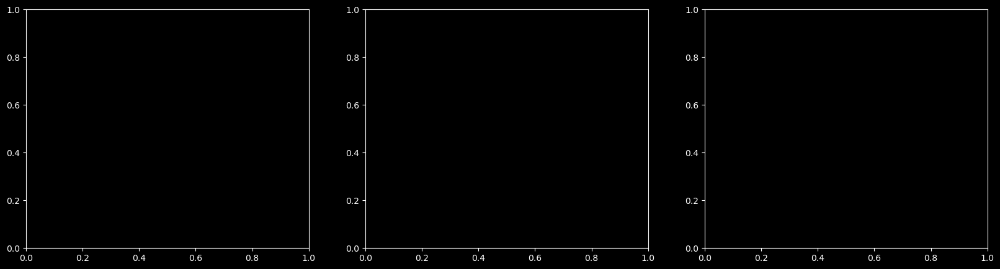

In [64]:
fig, axs = plt.subplots(1,3, figsize=(20,5))

sl_rmse = np.loadtxt(slda_path + "/rmse.txt")
sl2_rmse = np.loadtxt(slda2_path + "/rmse.txt")
sl3_rmse = np.loadtxt(slda3_path + "/rmse.txt")
ml2_rmse = np.loadtxt(mlda2_path + "/rmse.txt")
ml3_rmse = np.loadtxt(mlda3_path + "/rmse.txt")

for i in range(3):
    axs[i].set_yscale("log")
    axs[i].plot(sl_rmse[:,i], c="blue" , label = "SL fine")
    axs[i].plot(sl2_rmse[:,i],c="blue", alpha=0.66 ,  label="SL middle")
    axs[i].plot(sl3_rmse[:,i],c="blue", alpha=0.33 ,  label="SL coarse")
    axs[i].plot(ml2_rmse[:,i], c="red" ,  label="ML 2 levels")
    axs[i].plot(ml3_rmse[:,i], c="red", ls="--",  label="ML 3 levels")


for i in range(1,3):
    axs[i].axhline(np.sqrt(np.sum(500*np.ones((doubleJetCase_args["nx"],doubleJetCase_args["ny"]))*doubleJetCase_args["dx"]*doubleJetCase_args["dy"])), c="black")
    axs[i].set_ylim((1e7, 5e7))